# A Basic introduction to Convolutional Neural Networks
  <font size="5"> By: Pradip Gupta </font>

#### Some basic imports

In [1]:
from IPython.display import Image
from IPython.core.display import HTML 
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from scipy import signal

<font size="5">A convolutional neural network or CNN is a network architecture for deep learning that directly learns from images. </font>

Their name stems from one of the most important operations in the network: convolution. We will talk more about it later today. Just to mention, convolution operations are nothing but a weighted sum between two signals.

CNN can be used for: <br>
 - Image processing
 - Image classification
 - Image segmentaion
 - Object detection in images and many more cool stuff….

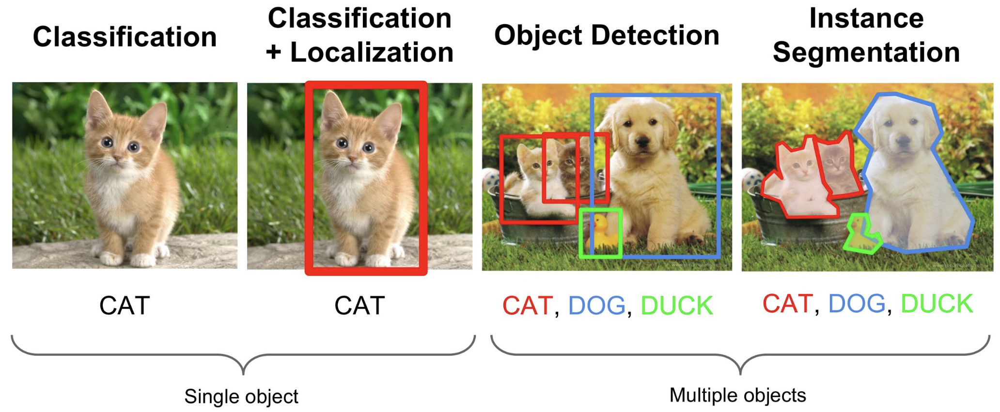

In [2]:
Image(filename = "images/applications.png", width=1000, height=500)

Convolutions have been around us for several decades. In 1998, Convolutional Neural Networks were introduced in a paper by Bengio, Le Cun, Bottou and Haffner. Their first Convolutional Neural Network was called LeNet-5 and was able to classify digits from hand-written numbers. Later in 2012, Alex Krizhevsky et al released AlexNet which was a deeper and much wider version of the LeNet and won by a large margin the difficult ImageNet competition.

More history on convolution: http://dataconomy.com/2017/04/history-neural-networks/

Convolutional layer is used for images where shape information and locality information is important. 
In this layer, we take a filter of given size and move that filter across the image to perform convolution operations.

## Understanding Convolutions

### Convolution is a very common method for image processing (or signal processing) <br>
### Convolving a kernel with an image, consists in scanning the kernel over the image, and computing the sum of the multiplication of the overlapping pixels

(1199, 1200, 3)

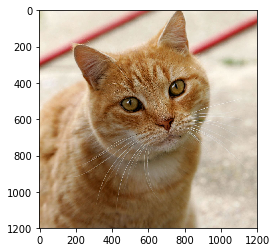

In [3]:
img = plt.imread('images/cat.jpg')
plt.imshow(img)
img.shape

(1199, 1200)

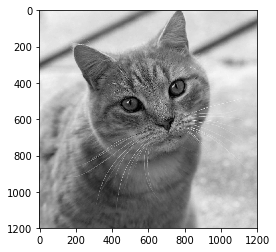

In [4]:
# the [...,:3] syntax limits the image to the RGB channels, removing alpha if there was any
gray = np.mean(img[...,:3], -1)
plt.imshow(gray, cmap='gray')
gray.shape

### A simple convolution operation
 - Consider the convolution operation on a gray scale image.
 - The blue grid is input layer and the kernel (size 3x3) is the shaded area in yellow.
 - At each location, the product between each element of the kernel and the input element it overlaps is computed and the results are summed up to obtain the output in the current location. The final output of this procedure is a matrix called output feature map (in green).

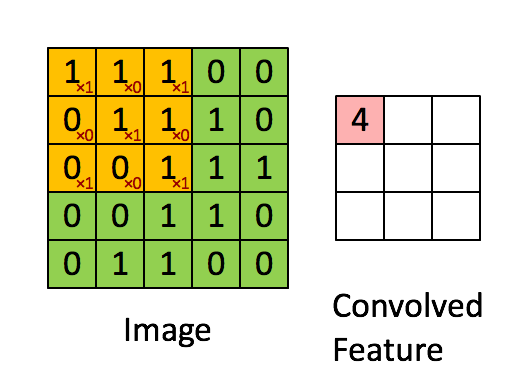

In [5]:
Image(filename = "images/cnn.gif", width=500, height=500)

### Some specific kernels

In [6]:
v_edge_kernel = np.array([[-1.0, 0.0, 1.0],
                          [-1.0, 0.0, 1.0],
                          [-1.0, 0.0, 1.0]])

In [7]:
v_edge = signal.convolve2d(gray, v_edge_kernel)

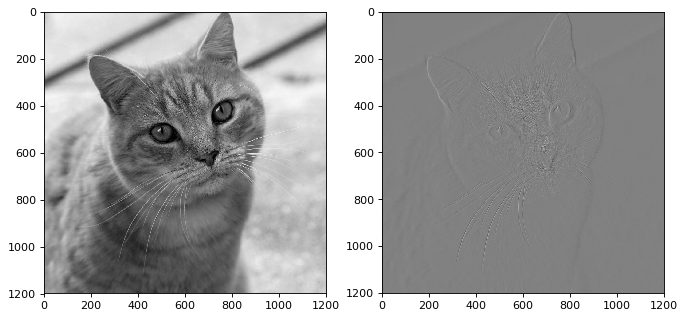

In [8]:
f = plt.figure(figsize=(10, 8), dpi= 80, facecolor='w', edgecolor='k')
f.add_subplot(1,2, 1)
plt.imshow(gray, cmap='gray')
f.add_subplot(1,2, 2)
plt.imshow(v_edge, cmap='gray')

In [9]:
sobel_v_kernel = np.array([[-1.0, -2.0, -1.0],
                           [ 0.0,  0.0,  0.0],
                           [ 1.0,  2.0,  1.0]])

In [10]:
sobel_v_edge = signal.convolve2d(gray, sobel_v_kernel)
sobel_h_edge = signal.convolve2d(gray, sobel_v_kernel.transpose())

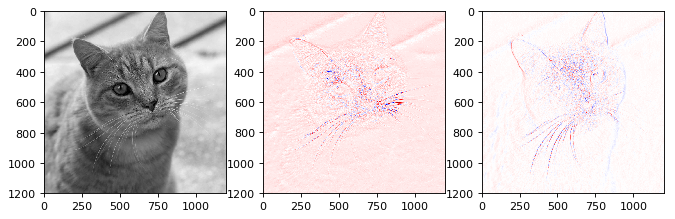

In [11]:
f = plt.figure(figsize=(10, 8), dpi= 80, facecolor='w', edgecolor='k')
f.add_subplot(1,3,1)
plt.imshow(gray, cmap='gray')
f.add_subplot(1,3,2)
plt.imshow(sobel_v_edge, cmap='seismic')
f.add_subplot(1,3,3)
plt.imshow(sobel_h_edge, cmap='seismic')

### A kernel convolution transforms the input image into an output representation that highlights specific features (lines, edges, etc..) of the input image.

## Explaining Convolutions in Neural Network

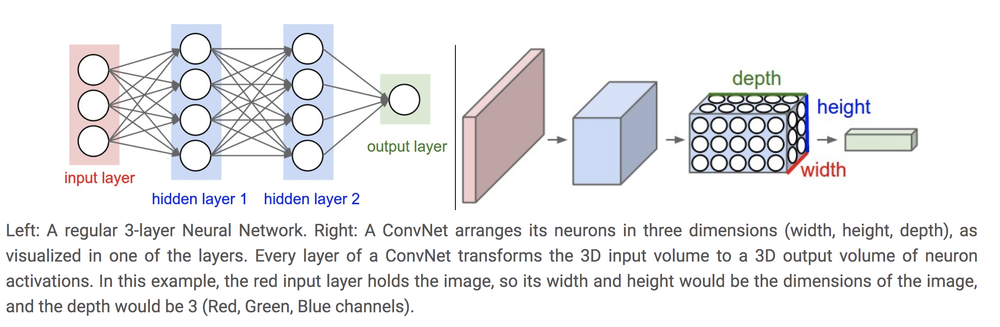

In [12]:
Image(filename = "images/basic-cnn1.png", width=1000, height=500)
# Source: http://cs231n.github.io/convolutional-networks/

#### Convolutional Neural Networks have a different architecture than regular Neural Networks. <br>
 - Regular Neural Networks transform an input by putting it through a series of hidden layers. 
 - Every layer is made up of a set of neurons, where each layer is fully connected to all neurons in the layer before. 
 - Finally, there is a last fully-connected layer — the output layer — that represent the predictions.

#### Convolutional Neural Networks are a bit different. 
 - First of all, the layers are organised in 3 dimensions: width, height and depth. 
 - <font size="4"> Further, the neurons in one layer do not connect to all the neurons in the next layer but only to a small region of it. (Local Perceptive fields) </font>
 - <font size="4"> All the neurons in a given layer have the same set of weights and biases, ie, each output layer (or filter) studies one type of feature in the input image (Shared Weights) </font>

Sailent Featuers:
	1. Local receptive fields
	2. Shared weights and biases (Translation Invariant)
    3. Strides enable subsampling of the CNN layers.
    4. CNN have translation symmetry. No matter where you detect object in the image, its features remain intact. 
    5. Activation and pooling

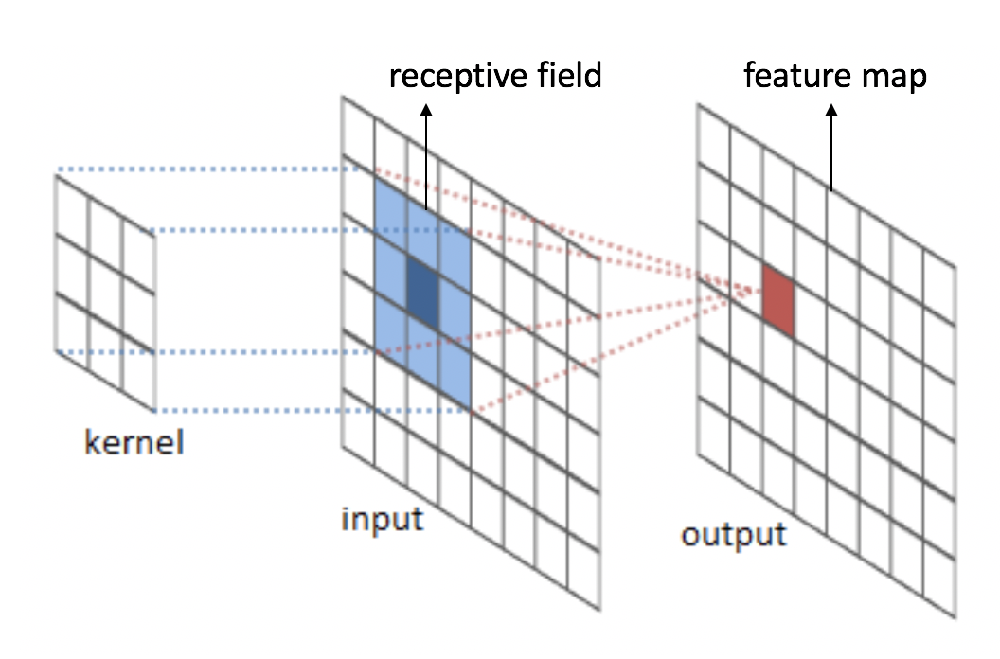

In [13]:
Image(filename = "images/receptive-field.png", width=500, height=400)

To define a convolutional layer, we basically need three things:
 - kernel size (say, 3x3)
 - strides (say 1x1)
 - no of output filters
 - padding

**Stride** is the size of the step the convolution filter moves each time. A stride size is usually 1, meaning the filter slides pixel by pixel. By increasing the stride size, your filter is sliding over the input with a larger interval and thus has less overlap between the cells.

Because the size of the feature map is always smaller than the input, we have to do something to prevent our feature map from shrinking. This is where we use **padding**.

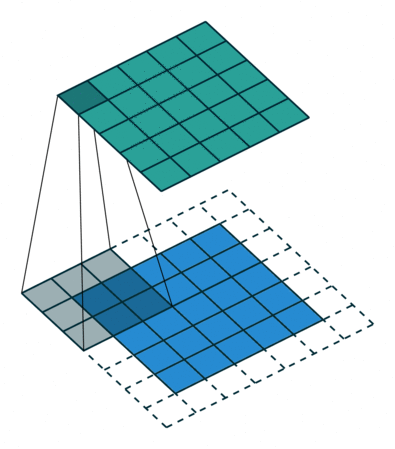

In [14]:
# Stride of 1 in action
Image(filename = "images/stride.gif", width=300, height=300)

### In Keras a Conv2D layer is defined as:

<font size="5"> keras.layers.Conv2D(filters, kernel_size, strides=(1, 1), padding='same', data_format=None, dilation_rate=(1, 1), activation=None, use_bias=True, kernel_initializer='glorot_uniform', bias_initializer='zeros', kernel_regularizer=None, bias_regularizer=None, activity_regularizer=None, kernel_constraint=None, bias_constraint=None) </font>

**No of weights = I * O * K**  <br>
where: 
 - I = no of i/p filters
 - O = no of o/p filters
 - K = kernel_size  
 
**No of bias = O**

### An excellent and complete visualtion of 2D convolution can be seen below

 - no_of_output_filters = 2 
 - kernel_size = 3  
 - stride = 2 
 - input_padding = 1
 
Note: Check for the property of **shared weights**
 
<font size="5"> conv = keras.layers.Conv2D(2, 3, strides=(1, 1), padding='valid') </font>

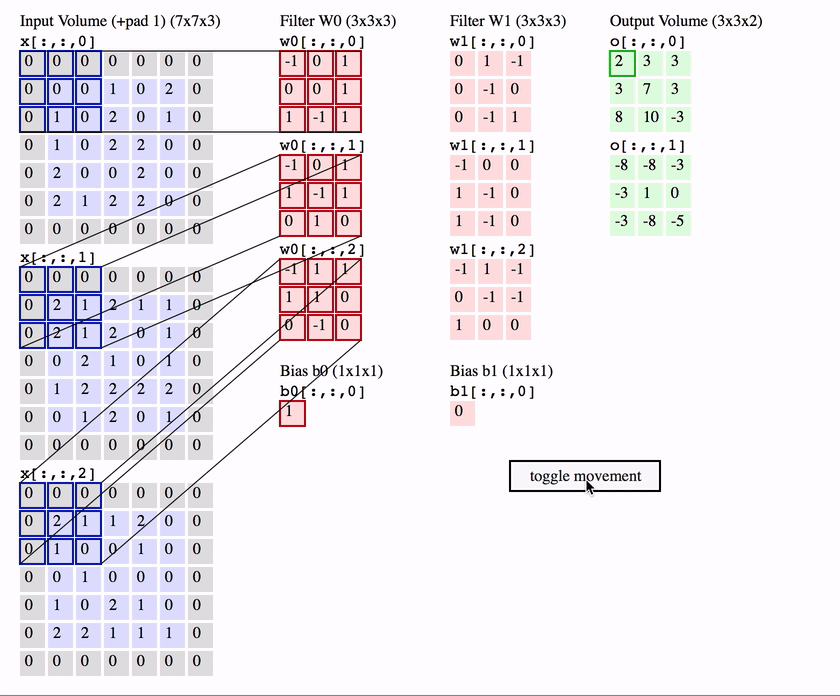

In [15]:
# Source: http://cs231n.github.io/convolutional-networks/
Image(filename = "images/convolutions.gif", width=1000, height=300)

### In a Convolutional Neural Network, a convolution layer is composed of a stack of convolution kernels that transform the input into multiple output images of 'features' highlighted by the kernel convolutions.

### The kernel values are coefficients that will be 'learned' by the model. This is how the model learns features specific to the images it is trained on.

### The no of output filters is basically the no of kernel configurations associated with that convolutional layer. Each Kernel configuration has its own set of weights and bias. 

<font size="4"> _**Convolutional layer outputs (also called as feature-maps) are often followed by Activation layer (usually Relu) and then pooling layers. In particular, there is a kind of layer called a max-pooling layer that is extremely popular**_. </font>

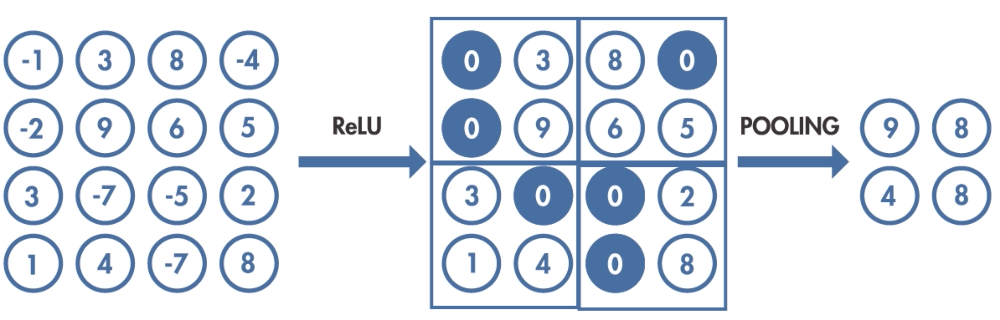

In [16]:
Image(filename = "images/act-pool.png", width=800, height=500)

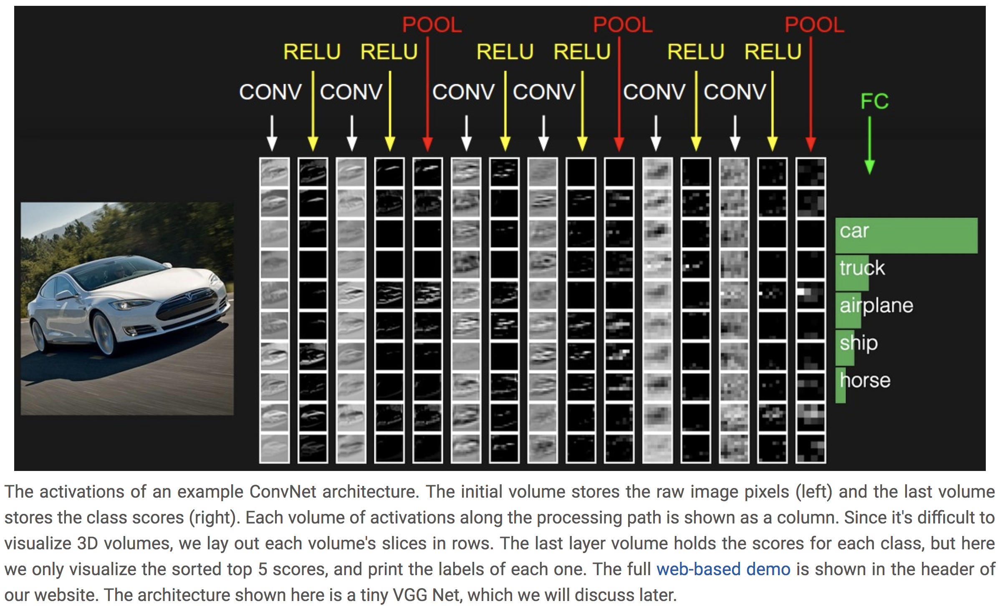

In [17]:
Image(filename = "images/overall.png", width=1000, height=400)
#Source: http://cs231n.github.io/convolutional-networks/

## Training a basic CNN model in Keras

## Step 1: Load your data

In [18]:
import os
import numpy as np
import matplotlib.pyplot as plt
from keras.datasets import mnist

Using TensorFlow backend.


In [19]:
# Load MNIST Data
(x_train, y_train), (x_test, y_test) = mnist.load_data()
x_train = np.expand_dims(x_train, -1).astype('float32') / 255
x_test = np.expand_dims(x_test, -1).astype('float32') / 255

x_train = x_train[:10000,...]
y_train = y_train[:10000,...]

x_test = x_test[:1000,...]
y_test = y_test[:1000,...]

print('x_train shape:', x_train.shape)
print('x_test shape:', x_test.shape)

x_train shape: (10000, 28, 28, 1)
x_test shape: (1000, 28, 28, 1)


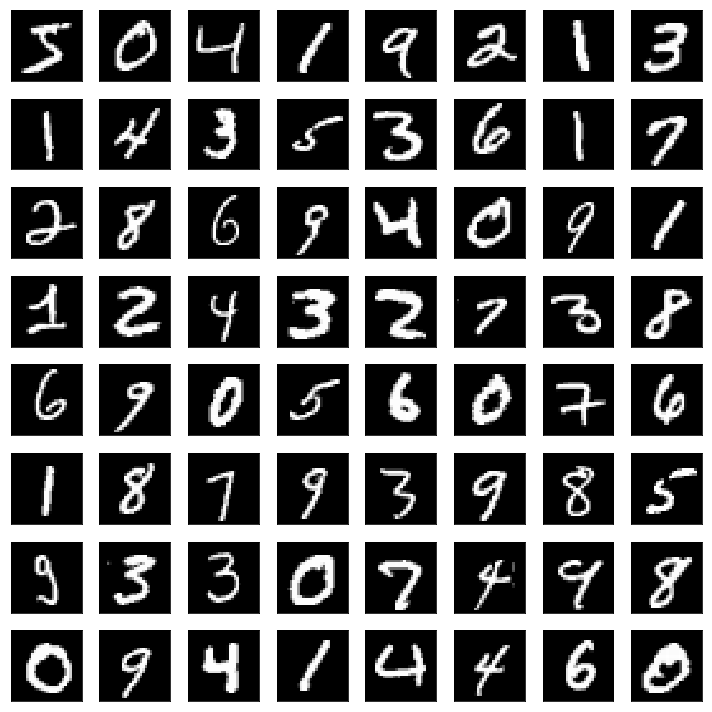

In [20]:
# VISUALIZE IMAGES
def plotImages( images, n_images=8):
    fig, axes = plt.subplots(n_images, n_images, figsize=(10, 10))
    axes = axes.flatten()
    for img, ax in zip(images, axes):
        ax.imshow(np.squeeze(img),cmap='gray')
        ax.set_xticks(())
        ax.set_yticks(())
    plt.tight_layout()
    plt.show()
    
plotImages(x_train)

## Step 2: Build your data generator

In [21]:
from keras.preprocessing.image import ImageDataGenerator

In [22]:
# Build data generator and model
datagen = ImageDataGenerator()

## Step 3: Build your model

In [23]:
from keras.layers import Input, Conv2D, MaxPooling2D, Dropout, GlobalAveragePooling2D, Flatten, Dense  
from keras.models import Model

In [24]:
def build_model(x_train, num_classes):
    
    input_layer = Input(shape=x_train.shape[1:])
    
    x = Conv2D(16, kernel_size=(3, 3), strides=(1, 1), padding='same', activation='relu')(input_layer)
    x = MaxPooling2D(pool_size=(2,2), strides=(1, 1), padding='same')(x)
    
    x = Conv2D(32, kernel_size=(3, 3), strides=(1, 1), padding='same', activation='relu')(x)
    x = MaxPooling2D(pool_size=(2,2), strides=(1, 1), padding='same')(x)
        
    flat = Flatten()(x)
    
    predictions = Dense(num_classes, activation="softmax")(flat)
    
    model = Model(inputs=input_layer, outputs=predictions)

    print(model.summary())
    
    return model

In [25]:
model = build_model(x_train, 10)

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 28, 28, 1)         0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 28, 28, 16)        160       
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 28, 28, 16)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 28, 28, 32)        4640      
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 28, 28, 32)        0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 25088)             0         
_________________________________________________________________
dense_1 (Dense)              (None, 10)                250890    
Total para

## Step 4: Compile your model

In [26]:
import keras.optimizers

In [27]:
optimizer = keras.optimizers.SGD(lr=0.01, momentum=0.9, clipnorm=5.0)
model.compile(loss='sparse_categorical_crossentropy',optimizer=optimizer, metrics=['accuracy'])

## Step 5: Train your model

In [28]:
# Train
history = model.fit_generator(
    datagen.flow(x_train, y_train, batch_size=64),
    steps_per_epoch=10, epochs=5, verbose=1,
    validation_data=(x_test, y_test)
)

Epoch 1/5
10/10 [==============================] - 1s 130ms/step - loss: 2.1412 - acc: 0.2719 - val_loss: 1.8172 - val_acc: 0.5400
Epoch 2/5
10/10 [==============================] - 1s 102ms/step - loss: 1.2083 - acc: 0.6578 - val_loss: 0.6647 - val_acc: 0.7990
Epoch 3/5
10/10 [==============================] - 1s 102ms/step - loss: 0.7531 - acc: 0.7766 - val_loss: 0.6582 - val_acc: 0.7980
Epoch 4/5
10/10 [==============================] - 1s 124ms/step - loss: 0.5038 - acc: 0.8156 - val_loss: 0.6521 - val_acc: 0.7840
Epoch 5/5
10/10 [==============================] - 1s 117ms/step - loss: 0.5344 - acc: 0.8375 - val_loss: 0.5332 - val_acc: 0.8370


## Step 6: Save your model

In [29]:
model.save("keras-model.h5")

## Additional Step: Analyse training

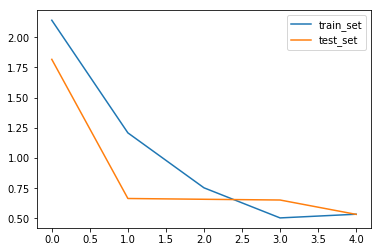

In [30]:
plt.plot(history.history['loss'], label='train_set')
plt.plot(history.history['val_loss'], label='test_set')
plt.legend()

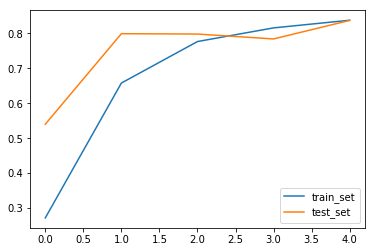

In [31]:
plt.plot(history.history['acc'], label='train_set')
plt.plot(history.history['val_acc'], label='test_set')
plt.legend()